In [1]:
# To validate this model
# Red queen dynamique :
# 	- Effet de la taille de la pop
# 	- Effet contradictoire sur le polymorphisme (effet seuil de la taille de la pop, en grande taille la taille de pop augmente; en petite taille, elle diminue)
# 	- Effet des interactions GfG, MA et leurs inverses
# 	  Géographie (mosaic theory of coevolution : augmente la divergence entre pop - traveaux de Sylvain Gandon)
# To test with this model
# - Effect of population size with continous matching alleles modèle
# - Effect of population size depending on sociality

# /DISQUE/FAC/Julia/julia-1.4.2-linux-x86_64/julia-1.4.2/bin/julia

# Set working directory
cd("/DISQUE/0_Grenoble/Biodiv_zoonoses/EvoSymbioses/")
# Set working directory
include("./1_LoadPkgs_importFunctions.jl");

#############################
# Compilation setting
# PRINT = ""  # Debbuging (printing MANY information during the computions to help identifying the origin of an error)
PRINT = "#" # No debbuging

# SIMD = "" # never use simd
SIMD = "@simd" # use simd for some loops (very few)

# FASTMATH = ""
FASTMATH = "@fastmath"

# NO_INLINE = ""
NO_INLINE = "@inline / @noinline"

# INBOUND = ""
INBOUND = "@inbounds"

# ALLOWSforLARGE_INACCURATE_dt = true
ALLOWSforLARGE_INACCURATE_dt = false
#############################

##################################################
############### Setting parameters ###############
##################################################
const NhostSp = 1
const NPops = 1

# Host population dynamics
const b0 = 5   # basal birth (the probability to have an offspring during one time step is  b0 * 2)
const d0 = 0.05 # death rates
const K = [[Int(1e2) for pop in 1:NPops] for sp in 1:NhostSp] # carrying capacity [for each species, one value per population]
# const K = [[Int(5e3), Int(0)] ,   [Int(1e3), Int(1e3)]] # carrying capacity [for each species, one value per population]
# K[1][1] *= 5
# K[2][1] *= 2

const thresholdApproxBinomial = 0.99

const PrevalenceIni = 0.75 # Start with a monomorphic parasit population with a prevalence of PrevalenceIni.
const N0 = [rand.(Poisson.(Int.(round.(K_./2 .* (1-PrevalenceIni))))) for K_ in K] # [for each sp[for each pop initial number of uninfected individuals]]
const N1 = [rand.(Poisson.(Int.(round.(K_./2 .* (  PrevalenceIni))))) for K_ in K] # [for each sp[for each pop initial number of   infected individuals]]
# N0[2][1] , N1[2][1] = 0, 0 # Initialy there is no species 2 in the population 1 (and vice versa but that is already done by the setting of the K object)
# N0 .+= N1 ; N1 -= N1

##  Transmission
const Ht = fill(50.0,NhostSp) # One value per host species. The average number of contacts between the parasites of one infected host and some other hosts when N=K
const HtCrossSp = 0.0 # The average number of contacts a host individual of the species SP_r (r for recipient) undergoes with the species SP_d (d for donor) when for both species N=K or whatever the values of N if 〖Sp〗_interact=1
const SpInteract = 0.5 # The proportion of contact induced by interspecies interactions that are independent of the species densities.
const Sociality = fill(0.75,NhostSp) # One value per host species. The proportion of these contacts that are independant of the host density (i.e. induced by social interactions)
const N_traits_infection_success = 1 # Number of trait which matching between the host and the parasites will determin P(infection|1 contact) noted Pinfection1contact

const Tol_infection = -10.0 # Shape of the relationship between Pinfection1contact and the distance between the host and parasit for the traits_infection_success
const Max_Pinfection1contact = 1.0
# const Min_Pinfection1contact = 0.0 by construction, it is set to zero.

##  Virulence
const Tol_virul = -500.0 # Shape of the relationship between Pinfection1contact and the virulence (the increase in the probability of death because of the infection)
const Max_virul = 0.1 # [0,1] Maximal virulence (this will be added to the death rate, the probability to die)
const Min_virul = 0.1 # [0,1] Minimal virulence (this will be added to the death rate, the probability to die)

## Host recovery
# Innate immunity
const N_traits_immunity = 1 # Number of trait which
# i)  matching between the host and the parasites will determine the probability to recover thank to innate immune system P(innate immu.->recovery) noted P_recovery_innate_immu
# ii) matching between the parasites genotypes Pg and Ph will determine the probability to recover thank to cross immuniny P(recovery_Pg|acquired immu._Ph) which will be stored in the tuple of tuples P_recovery_acquired_immu
const Tol_InnateImmu = -10.0 # Shape of the relationship between P_recovery_innate_immu and the minimum of the distances between the host and parasit for the traits_immunity
const Max_Precovery_innate_immu = 0.95

# Adaptive immune system and Cross-immunity
const SimulateImmunisation = true # Should the Adaptive immunity be simulated ?
const Tol_CrossImmun = 0.0 # Shape of the relationship between P(recovery_Pg|acquired immu._Ph) and the distance between the parasites genotypes Pg and Ph for the traits_immunity
const Max_Precovery_acquiered_immu = 0.25

### Evolution
const Maxrate_of_gametes_prod = 1.0       # Expected number of gamètes   produced during one time step by one host              which fitness                    is maximal. If GfG is false, then fitness is always maximal.
const MaxRate_of_parasites_emission = 1.0 # Expected number of parasites produced during one time step by one infected host for which the fitness of the parasit is maximal. If GfG is false, then fitness is always maximal.

const GfG = false# should an (inverse) Gene for Gene dynamic be modeled by allowing traits to appear and disappear ?
if GfG
    const MaxHostCostOfMissing_traits_infection_success = 0.0 # Value of rate_of_gametes_prod       if NtraitsInfectionSuccessPresent = 0                          when NtraitsImmunityPresent         = 0                            (NtraitsImmunityPresent         = 0                            maximize the value of rate_of_gametes_prod )
    const MaxHostCostOfHaving_traits_immunity = 2.0           # Value of rate_of_gametes_prod       if NtraitsImmunityPresent         = N_traits_immunity*2        when NtraitsInfectionSuccessPresent = N_traits_infection_success*2 (NtraitsInfectionSuccessPresent = N_traits_infection_success*2 maximize the value of rate_of_gametes_prod )
    const MaxParasCostOfHaving_traits_infection_success = 1.0 # Value of rate_of_parasites_emission if NtraitsInfectionSuccessPresent = N_traits_infection_success when NtraitsImmunityPresent         = N_traits_immunity            (NtraitsImmunityPresent         = N_traits_immunity            maximize the value of rate_of_parasites_emission)
    const MaxParasCostOfMissing_traits_immunity = 2.0         # Value of rate_of_parasites_emission if NtraitsImmunityPresent         = 0                          when NtraitsInfectionSuccessPresent = 0                            (NtraitsInfectionSuccessPresent = 0                            maximize the value of rate_of_parasites_emission)

    const TolHostCostOfMissing_traits_infection_success = 0.0 # Shape of the relationship between NtraitsInfectionSuccessPresent and Maxrate_of_gametes_prod
    const TolParasCostOfMissing_traits_immunity = 0.0         # Shape of the relationship between NtraitsImmunityPresent         and rate_of_gametes_prod
    const TolHostCostOfHaving_traits_immunity = 0.0           # Shape of the relationship between NtraitsImmunityPresent         and Maxrate_of_gametes_prod
    const TolParasCostOfHaving_traits_infection_success = 0.0 # Shape of the relationship between NtraitsInfectionSuccessPresent and rate_of_gametes_prod
end

## Evolution
const NallelesPerTrait = 6
const DistBetweenHostSp = 0 # number of alleles that separate each host species for the traits_infection_success
const PhenotypicStochasticity = false # Do we want to modèle PhenotypicStochasticity ?
# The following line only matters if PhenotypicStochasticity is set to true
const OnePhenNoiseTraitPerTrait = true # Should each trait have its own Phenotypic Noise ?

# Mutation rate for each trait
const MuHost_trait_alleles = [0.02 for sp in 1:NhostSp] # one mutation rate per species
const MuParasit_trait_alleles = 0.05 # mutation rate
const MuEffectHost = const MuEffectParasites = 0.5 # Average proportion of the range of alleles values covered by only one mutation
if GfG
    const MuHost_trait_presence = [0.001 for sp in 1:NhostSp] # one mutation rate per species
    const MuParasit_trait_presence = 0.001 # mutation rate
end
# For each species, probability that an individual migrate (for simplicity we assum that individuals can migrate to there own population - with a probability that depend on carrying capacities)
# No population structure corresponds to MigrRate = 1.0
MigrRate = [0.0 for sp in 1:NhostSp]


## Simulation parameters
# dt : time increment
dt = 0.01 # Float
# Maximal duration of the simulation to reach the equilibrium (if the equilibrium has not been reached after that time, the simulation stops any way)
# Whether the equilibrium has been reached or not is recorded in MetaCommunity.Storage.EquilibriumAllPop[]
const MaxTimeToEquilibrium = 20000.0 # Float
# Duration of the simulation once equilibrium as been reached (same unit as dt)
const TimeAfterEquilibrium = 1000.0 # Float
# AfterEquilibrium, at which frequency the state of the population should be recorded ?
const RecordEvery = dt*10 # 5.0 # Float
# Should only the dynamic after Equilibrium be kept ?
OnlyRecordDynamicAfterEquilibrium = true # true

# Number of repeatition of each simulation
Nsimulations = 1
# Number of repeatition of each simulation
DiscardeSimulationIfEquilibriumNoReached = true

## RecordStatistics : function that will be applied at the end of each simulation to record some statistics
RecordedStatistics = "./out.txt" # name of the file where the statistics will be written
NamesOfRecordedStatistics = flat([[["Hosts$(sp)He_immunity_pop$(pop)","Hosts$(sp)He_infection_success_pop$(pop)","Parasites_in_H$(sp)_He_immunity_pop$(pop)","Parasites_in_H$(sp)_He_infection_success_pop$(pop)"] for sp in 1:NhostSp] for pop in 1:NPops])
# set these variables to 'nothing' if you don't want to record some statistics
function RecordStatistics(X)
    function GetP_He(trait::Int,X,pop::Int,sp::Int)
        alleles = unique([g.Alleles[trait] for g in X.parasitesGenotypeS_List.GenotypeS])
        if length( X.MetaPopS[sp].PopS[pop].ParasitesPop.IDpS ) > 0
            Freq::Vector{Union{Int,Float}} = [ sum([if (g.Alleles[trait] === allele) sum(X.MetaPopS[sp].PopS[pop].ParasitesPop.N_[X.MetaPopS[sp].PopS[pop].ParasitesPop.IDpS .=== g.IDp]) else 0 end for g in X.parasitesGenotypeS_List.GenotypeS]) for allele in alleles ]
            Freq ./= sum(Freq)
            return(1-sum(Freq.^2))
        else
            return 0.0
        end
    end
    out = Vector{Float}()
    for pop in 1:NPops
        for sp in 1:NhostSp
            # "Hosts$(sp)He_immunity"
            push!(out, mean([ 1-sum((sum([X.MetaPopS[sp].PopS[pop].HostSexS[sex].AllelesPool[trait] for sex in 1:2])./2).^2) for trait in 1:N_traits_immunity]) )
            # "Hosts$(sp)He_infection_success"
            push!(out, mean([ 1-sum((sum([X.MetaPopS[sp].PopS[pop].HostSexS[sex].AllelesPool[trait] for sex in 1:2])./2).^2) for trait in N_traits_immunity:(N_traits_immunity+N_traits_infection_success)]))
            # "Parasites_in_H$(sp)_He_immunity"
            push!(out, mean([ GetP_He(trait,X,pop,sp) for trait in 1:N_traits_immunity]))
            # "Parasites_in_H$(sp)_He_infection_success"
            push!(out, mean([ GetP_He(trait,X,pop,sp) for trait in N_traits_immunity:(N_traits_immunity+N_traits_infection_success)]))
        end
    end
    # The output of this function must be a Vector which values will be appended to the file "RecordedStatistics".
    # They will be separated by tabulations ("\t").
    return(out)
end

include("./2_ProcessParameters.jl");

PlotParameters(legendfontsize=7)

# Run the simulations
include("./4_RunSimulations.jl");


111


2×14 DataFrame
 Row │ IDhS   IDhSphen  IDpS   IDpSphen  IDp_HostShiftHistoryS             IDi ⋯
     │ Int64  Int64     Int64  Int64     Symbol                            Sym ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │  1516      1516      0         0  IDparasitCat_0_0                  _0  ⋯
   2 │  1516      1516     19        19  IDp°19__Sp°1°°Time°0.0°°IDh°1516  _0
                                                               9 columns omitted
112


2×14 DataFrame
 Row │ IDhS   IDhSphen  IDpS   IDpSphen  IDp_HostShiftHistoryS             IDi ⋯
     │ Int64  Int64     Int64  Int64     Symbol                            Sym ⋯
─────┼──────────────────────────────────────────────────────────────────────────
   1 │  1516      1516      0         0  IDparasitCat_0_0                  _0  ⋯
   2 │  1516      1516     19        19  IDp°19__Sp°1°°Time°0.0°°IDh°1516  _0
                                                               9 columns 

27.710000000001532
27.810000000001548
27.910000000001563
28.01000000000158
28.110000000001595
28.21000000000161
28.310000000001626
28.41000000000164
28.510000000001657
28.610000000001673
28.71000000000169
28.810000000001704
28.91000000000172
29.010000000001735
29.11000000000175
29.210000000001767
29.310000000001782
29.410000000001798
29.510000000001813
29.61000000000183
29.710000000001845
29.81000000000186
29.910000000001876
30.01000000000189
30.110000000001907
30.210000000001923
30.31000000000194
30.410000000001954
30.51000000000197
30.610000000001985
30.710000000002
30.810000000002017
30.910000000002032
31.010000000002048
31.110000000002064
31.21000000000208
31.310000000002095
31.41000000000211
31.510000000002126
31.61000000000214
31.710000000002157
31.810000000002173
31.91000000000219
32.0100000000022
32.11000000000218
32.21000000000216
32.31000000000214
32.41000000000212
32.5100000000021
32.61000000000208
32.71000000000206
32.81000000000204
32.91000000000202
33.010000000002
33.1100

74.71000000000132
74.81000000000137
74.91000000000142
75.01000000000147
75.11000000000152
75.21000000000157
75.31000000000162
75.41000000000167
75.51000000000172
75.61000000000178
75.71000000000183
75.81000000000188
75.91000000000193
76.01000000000198
76.11000000000203
76.21000000000208
76.31000000000213
76.41000000000219
76.51000000000224
76.61000000000229
76.71000000000234
76.81000000000239
76.91000000000244
77.01000000000249
77.11000000000254
77.2100000000026
77.31000000000265
77.4100000000027
77.51000000000275
77.6100000000028
77.71000000000285
77.8100000000029
77.91000000000295
78.010000000003
78.11000000000305
78.2100000000031
78.31000000000316
78.41000000000321
78.51000000000326
78.61000000000331
78.71000000000336
78.81000000000341
78.91000000000346
79.01000000000352
79.11000000000357
79.21000000000362
79.31000000000367
79.41000000000372
79.51000000000377
79.61000000000382
79.71000000000387
79.81000000000392
79.91000000000398
80.01000000000403
80.11000000000408
80.21000000000413

120.21000000002459
120.31000000002464
120.4100000000247
120.51000000002475
120.6100000000248
120.71000000002485
120.8100000000249
120.91000000002495
121.010000000025
121.11000000002505
121.2100000000251
121.31000000002516
121.4100000000252
121.51000000002526
121.61000000002531
121.71000000002536
121.81000000002541
121.91000000002546
122.01000000002551
122.11000000002556
122.21000000002562
122.31000000002567
122.41000000002572
122.51000000002577
122.61000000002582
122.71000000002587
122.81000000002592
122.91000000002597
123.01000000002603
123.11000000002608
123.21000000002613
123.31000000002618
123.41000000002623
123.51000000002628
123.61000000002633
123.71000000002638
123.81000000002643
123.91000000002649
124.01000000002654
124.11000000002659
124.21000000002664
124.31000000002669
124.41000000002674
124.51000000002679
124.61000000002684
124.7100000000269
124.81000000002695
124.910000000027
125.01000000002705
125.1100000000271
125.21000000002715
125.3100000000272
125.41000000002725
125.5

165.2199999999947
165.31999999999462
165.41999999999453
165.51999999999444
165.61999999999435
165.71999999999426
165.81999999999417
165.91999999999408
166.01999999999398
166.1199999999939
166.2199999999938
166.3199999999937
166.41999999999362
166.51999999999353
166.61999999999344
166.71999999999335
166.81999999999326
166.91999999999317
167.01999999999308
167.11999999999298
167.2199999999929
167.3199999999928
167.4199999999927
167.51999999999262
167.61999999999253
167.71999999999244
167.81999999999235
167.91999999999226
168.01999999999217
168.11999999999207
168.21999999999198
168.3199999999919
168.4199999999918
168.5199999999917
168.61999999999162
168.71999999999153
168.81999999999144
168.91999999999135
169.01999999999126
169.11999999999117
169.21999999999107
169.31999999999098
169.4199999999909
169.5199999999908
169.6199999999907
169.71999999999062
169.81999999999053
169.91999999999044
170.01999999999035
170.11999999999026
170.21999999999016
170.31999999999007
170.41999999998998
170.51

209.71999999995424
209.81999999995415
209.91999999995406
210.01999999995397
210.11999999995388
210.21999999995379
210.3199999999537
210.4199999999536
210.5199999999535
210.61999999995342
210.71999999995333
210.81999999995324
210.91999999995315
211.01999999995306
211.11999999995297
211.21999999995288
211.31999999995278
211.4199999999527
211.5199999999526
211.6199999999525
211.71999999995242
211.81999999995233
211.91999999995224
212.01999999995215
212.11999999995206
212.21999999995197
212.31999999995188
212.41999999995178
212.5199999999517
212.6199999999516
212.7199999999515
212.81999999995142
212.91999999995133
213.01999999995124
213.11999999995115
213.21999999995106
213.31999999995097
213.41999999995087
213.51999999995078
213.6199999999507
213.7199999999506
213.8199999999505
213.91999999995042
214.01999999995033
214.11999999995024
214.21999999995015
214.31999999995006
214.41999999994997
214.51999999994987
214.61999999994978
214.7199999999497
214.8199999999496
214.9199999999495
215.0199

254.81999999991322
254.91999999991313
255.01999999991304
255.11999999991295
255.21999999991286
255.31999999991277
255.41999999991268
255.51999999991259
255.6199999999125
255.7199999999124
255.8199999999123
255.91999999991222
256.01999999991216
256.11999999991207
256.219999999912
256.3199999999119
256.4199999999118
256.5199999999117
256.6199999999116
256.7199999999115
256.81999999991143
256.91999999991134
257.01999999991125
257.11999999991116
257.21999999991107
257.319999999911
257.4199999999109
257.5199999999108
257.6199999999107
257.7199999999106
257.8199999999105
257.91999999991043
258.01999999991034
258.11999999991025
258.21999999991016
258.31999999991007
258.41999999991
258.5199999999099
258.6199999999098
258.7199999999097
258.8199999999096
258.9199999999095
259.01999999990943
259.11999999990934
259.21999999990925
259.31999999990916
259.41999999990907
259.519999999909
259.6199999999089
259.7199999999088
259.8199999999087
259.9199999999086
260.0199999999085
260.11999999990843
260.21

300.9199999998713
301.01999999987123
301.11999999987114
301.21999999987105
301.31999999987096
301.41999999987087
301.5199999998708
301.6199999998707
301.7199999998706
301.8199999998705
301.9199999998704
302.0199999998703
302.11999999987023
302.21999999987014
302.31999999987005
302.41999999986996
302.51999999986987
302.6199999998698
302.7199999998697
302.8199999998696
302.9199999998695
303.0199999998694
303.1199999998693
303.21999999986923
303.31999999986914
303.41999999986905
303.51999999986896
303.61999999986887
303.7199999998688
303.8199999998687
303.9199999998686
304.0199999998685
304.1199999998684
304.2199999998683
304.31999999986823
304.41999999986814
304.51999999986805
304.61999999986796
304.71999999986787
304.8199999998678
304.9199999998677
305.0199999998676
305.1199999998675
305.2199999998674
305.3199999998673
305.41999999986723
305.51999999986714
305.61999999986705
305.71999999986696
305.81999999986687
305.9199999998668
306.0199999998667
306.1199999998666
306.2199999998665
306

347.1199999998293
347.2199999998292
347.3199999998291
347.41999999982903
347.51999999982894
347.61999999982885
347.71999999982876
347.81999999982867
347.9199999998286
348.0199999998285
348.1199999998284
348.2199999998283
348.3199999998282
348.4199999998281
348.51999999982803
348.61999999982794
348.71999999982785
348.81999999982776
348.91999999982767
349.0199999998276
349.1199999998275
349.2199999998274
349.3199999998273
349.4199999998272
349.5199999998271
349.61999999982703
349.71999999982694
349.81999999982685
349.91999999982676
350.01999999982667
350.1199999998266
350.2199999998265
350.3199999998264
350.4199999998263
350.5199999998262
350.6199999998261
350.71999999982603
350.81999999982594
350.91999999982585
351.01999999982576
351.11999999982567
351.2199999998256
351.3199999998255
351.4199999998254
351.5199999998253
351.6199999998252
351.7199999998251
351.81999999982503
351.91999999982494
352.01999999982485
352.11999999982476
352.21999999982467
352.3199999998246
352.4199999998245
352

391.81999999978865
391.91999999978856
392.01999999978847
392.1199999997884
392.2199999997883
392.3199999997882
392.4199999997881
392.519999999788
392.6199999997879
392.71999999978783
392.81999999978774
392.91999999978765
393.01999999978756
393.11999999978747
393.2199999997874
393.3199999997873
393.4199999997872
393.5199999997871
393.619999999787
393.7199999997869
393.81999999978683
393.91999999978674
394.01999999978665
394.11999999978656
394.21999999978647
394.3199999997864
394.4199999997863
394.5199999997862
394.6199999997861
394.719999999786
394.8199999997859
394.91999999978583
395.01999999978574
395.11999999978565
395.21999999978556
395.31999999978547
395.4199999997854
395.5199999997853
395.6199999997852
395.7199999997851
395.819999999785
395.9199999997849
396.01999999978483
396.11999999978474
396.21999999978465
396.31999999978456
396.41999999978447
396.5199999997844
396.6199999997843
396.7199999997842
396.8199999997841
396.919999999784
397.0199999997839
397.11999999978383
397.21999

437.9199999997467
438.01999999974663
438.11999999974654
438.21999999974645
438.31999999974636
438.41999999974627
438.5199999997462
438.6199999997461
438.719999999746
438.8199999997459
438.9199999997458
439.0199999997457
439.11999999974563
439.21999999974554
439.31999999974545
439.41999999974536
439.51999999974527
439.6199999997452
439.7199999997451
439.819999999745
439.9199999997449
440.0199999997448
440.1199999997447
440.21999999974463
440.31999999974454
440.41999999974445
440.51999999974436
440.61999999974427
440.7199999997442
440.8199999997441
440.919999999744
441.0199999997439
441.1199999997438
441.2199999997437
441.31999999974363
441.41999999974354
441.51999999974345
441.61999999974336
441.71999999974327
441.8199999997432
441.9199999997431
442.019999999743
442.1199999997429
442.2199999997428
442.3199999997427
442.41999999974263
442.51999999974254
442.61999999974245
442.71999999974236
442.81999999974227
442.9199999997422
443.0199999997421
443.119999999742
443.2199999997419
443.3199

483.31999999970543
483.41999999970534
483.51999999970525
483.61999999970516
483.71999999970507
483.819999999705
483.9199999997049
484.0199999997048
484.1199999997047
484.2199999997046
484.3199999997045
484.41999999970443
484.51999999970434
484.61999999970425
484.71999999970416
484.81999999970407
484.919999999704
485.0199999997039
485.1199999997038
485.2199999997037
485.3199999997036
485.4199999997035
485.51999999970343
485.61999999970334
485.71999999970325
485.81999999970316
485.91999999970307
486.019999999703
486.1199999997029
486.2199999997028
486.3199999997027
486.4199999997026
486.5199999997025
486.61999999970243
486.71999999970234
486.81999999970225
486.91999999970216
487.01999999970207
487.119999999702
487.2199999997019
487.3199999997018
487.4199999997017
487.5199999997016
487.6199999997015
487.71999999970143
487.81999999970134
487.91999999970125
488.01999999970116
488.11999999970107
488.219999999701
488.3199999997009
488.4199999997008
488.5199999997007
488.6199999997006
488.7199

529.0199999996639
529.1199999996638
529.2199999996637
529.3199999996637
529.4199999996636
529.5199999996635
529.6199999996634
529.7199999996633
529.8199999996632
529.9199999996631
530.019999999663
530.1199999996629
530.2199999996628
530.3199999996627
530.4199999996627
530.5199999996626
530.6199999996625
530.7199999996624
530.8199999996623
530.9199999996622
531.0199999996621
531.119999999662
531.2199999996619
531.3199999996618
531.4199999996617
531.5199999996616
531.6199999996616
531.7199999996615
531.8199999996614
531.9199999996613
532.0199999996612
532.1199999996611
532.219999999661
532.3199999996609
532.4199999996608
532.5199999996607
532.6199999996606
532.7199999996606
532.8199999996605
532.9199999996604
533.0199999996603
533.1199999996602
533.2199999996601
533.31999999966
533.4199999996599
533.5199999996598
533.6199999996597
533.7199999996596
533.8199999996596
533.9199999996595
534.0199999996594
534.1199999996593
534.2199999996592
534.3199999996591
534.419999999659
534.519999999658

575.0199999996221
575.119999999622
575.2199999996219
575.3199999996218
575.4199999996217
575.5199999996216
575.6199999996215
575.7199999996215
575.8199999996214
575.9199999996213
576.0199999996212
576.1199999996211
576.219999999621
576.3199999996209
576.4199999996208
576.5199999996207
576.6199999996206
576.7199999996205
576.8199999996204
576.9199999996204
577.0199999996203
577.1199999996202
577.2199999996201
577.31999999962
577.4199999996199
577.5199999996198
577.6199999996197
577.7199999996196
577.8199999996195
577.9199999996194
578.0199999996194
578.1199999996193
578.2199999996192
578.3199999996191
578.419999999619
578.5199999996189
578.6199999996188
578.7199999996187
578.8199999996186
578.9199999996185
579.0199999996184
579.1199999996184
579.2199999996183
579.3199999996182
579.4199999996181
579.519999999618
579.6199999996179
579.7199999996178
579.8199999996177
579.9199999996176
580.0199999996175
580.1199999996174
580.2199999996174
580.3199999996173
580.4199999996172
580.519999999617

622.5199999995789
622.6199999995788
622.7199999995787
622.8199999995786
622.9199999995785
623.0199999995784
623.1199999995783
623.2199999995782
623.3199999995782
623.4199999995781
623.519999999578
623.6199999995779
623.7199999995778
623.8199999995777
623.9199999995776
624.0199999995775
624.1199999995774
624.2199999995773
624.3199999995772
624.4199999995772
624.5199999995771
624.619999999577
624.7199999995769
624.8199999995768
624.9199999995767
625.0199999995766
625.1199999995765
625.2199999995764
625.3199999995763
625.4199999995762
625.5199999995762
625.6199999995761
625.719999999576
625.8199999995759
625.9199999995758
626.0199999995757
626.1199999995756
626.2199999995755
626.3199999995754
626.4199999995753
626.5199999995752
626.6199999995752
626.7199999995751
626.819999999575
626.9199999995749
627.0199999995748
627.1199999995747
627.2199999995746
627.3199999995745
627.4199999995744
627.5199999995743
627.6199999995742
627.7199999995742
627.8199999995741
627.919999999574
628.01999999957

668.519999999537
668.619999999537
668.7199999995369
668.8199999995368
668.9199999995367
669.0199999995366
669.1199999995365
669.2199999995364
669.3199999995363
669.4199999995362
669.5199999995361
669.619999999536
669.719999999536
669.8199999995359
669.9199999995358
670.0199999995357
670.1199999995356
670.2199999995355
670.3199999995354
670.4199999995353
670.5199999995352
670.6199999995351
670.719999999535
670.819999999535
670.9199999995349
671.0199999995348
671.1199999995347
671.2199999995346
671.3199999995345
671.4199999995344
671.5199999995343
671.6199999995342
671.7199999995341
671.819999999534
671.919999999534
672.0199999995339
672.1199999995338
672.2199999995337
672.3199999995336
672.4199999995335
672.5199999995334
672.6199999995333
672.7199999995332
672.8199999995331
672.919999999533
673.019999999533
673.1199999995329
673.2199999995328
673.3199999995327
673.4199999995326
673.5199999995325
673.6199999995324
673.7199999995323
673.8199999995322
673.9199999995321
674.019999999532
674

715.6199999994942
715.7199999994941
715.819999999494
715.9199999994939
716.0199999994938
716.1199999994938
716.2199999994937
716.3199999994936
716.4199999994935
716.5199999994934
716.6199999994933
716.7199999994932
716.8199999994931
716.919999999493
717.0199999994929
717.1199999994928
717.2199999994928
717.3199999994927
717.4199999994926
717.5199999994925
717.6199999994924
717.7199999994923
717.8199999994922
717.9199999994921
718.019999999492
718.1199999994919
718.2199999994918
718.3199999994918
718.4199999994917
718.5199999994916
718.6199999994915
718.7199999994914
718.8199999994913
718.9199999994912
719.0199999994911
719.119999999491
719.2199999994909
719.3199999994908
719.4199999994908
719.5199999994907
719.6199999994906
719.7199999994905
719.8199999994904
719.9199999994903
720.0199999994902
720.1199999994901
720.21999999949
720.3199999994899
720.4199999994898
720.5199999994898
720.6199999994897
720.7199999994896
720.8199999994895
720.9199999994894
721.0199999994893
721.119999999489

762.7199999994514
762.8199999994513
762.9199999994512
763.0199999994511
763.119999999451
763.2199999994509
763.3199999994508
763.4199999994507
763.5199999994506
763.6199999994506
763.7199999994505
763.8199999994504
763.9199999994503
764.0199999994502
764.1199999994501
764.21999999945
764.3199999994499
764.4199999994498
764.5199999994497
764.6199999994496
764.7199999994496
764.8199999994495
764.9199999994494
765.0199999994493
765.1199999994492
765.2199999994491
765.319999999449
765.4199999994489
765.5199999994488
765.6199999994487
765.7199999994486
765.8199999994486
765.9199999994485
766.0199999994484
766.1199999994483
766.2199999994482
766.3199999994481
766.419999999448
766.5199999994479
766.6199999994478
766.7199999994477
766.8199999994476
766.9199999994476
767.0199999994475
767.1199999994474
767.2199999994473
767.3199999994472
767.4199999994471
767.519999999447
767.6199999994469
767.7199999994468
767.8199999994467
767.9199999994466
768.0199999994466
768.1199999994465
768.219999999446

810.3199999994081
810.419999999408
810.5199999994079
810.6199999994078
810.7199999994077
810.8199999994076
810.9199999994075
811.0199999994074
811.1199999994074
811.2199999994073
811.3199999994072
811.4199999994071
811.519999999407
811.6199999994069
811.7199999994068
811.8199999994067
811.9199999994066
812.0199999994065
812.1199999994064
812.2199999994064
812.3199999994063
812.4199999994062
812.5199999994061
812.619999999406
812.7199999994059
812.8199999994058
812.9199999994057
813.0199999994056
813.1199999994055
813.2199999994054
813.3199999994054
813.4199999994053
813.5199999994052
813.6199999994051
813.719999999405
813.8199999994049
813.9199999994048
814.0199999994047
814.1199999994046
814.2199999994045
814.3199999994044
814.4199999994044
814.5199999994043
814.6199999994042
814.7199999994041
814.819999999404
814.9199999994039
815.0199999994038
815.1199999994037
815.2199999994036
815.3199999994035
815.4199999994034
815.5199999994034
815.6199999994033
815.7199999994032
815.81999999940

857.5199999993652
857.6199999993651
857.719999999365
857.8199999993649
857.9199999993648
858.0199999993647
858.1199999993646
858.2199999993645
858.3199999993644
858.4199999993643
858.5199999993642
858.6199999993642
858.7199999993641
858.819999999364
858.9199999993639
859.0199999993638
859.1199999993637
859.2199999993636
859.3199999993635
859.4199999993634
859.5199999993633
859.6199999993632
859.7199999993632
859.8199999993631
859.919999999363
860.0199999993629
860.1199999993628
860.2199999993627
860.3199999993626
860.4199999993625
860.5199999993624
860.6199999993623
860.7199999993622
860.8199999993622
860.9199999993621
861.019999999362
861.1199999993619
861.2199999993618
861.3199999993617
861.4199999993616
861.5199999993615
861.6199999993614
861.7199999993613
861.8199999993612
861.9199999993612
862.0199999993611
862.119999999361
862.2199999993609
862.3199999993608
862.4199999993607
862.5199999993606
862.6199999993605
862.7199999993604
862.8199999993603
862.9199999993602
863.01999999936

905.6199999993214
905.7199999993213
905.8199999993212
905.9199999993211
906.019999999321
906.119999999321
906.2199999993209
906.3199999993208
906.4199999993207
906.5199999993206
906.6199999993205
906.7199999993204
906.8199999993203
906.9199999993202
907.0199999993201
907.11999999932
907.21999999932
907.3199999993199
907.4199999993198
907.5199999993197
907.6199999993196
907.7199999993195
907.8199999993194
907.9199999993193
908.0199999993192
908.1199999993191
908.219999999319
908.319999999319
908.4199999993189
908.5199999993188
908.6199999993187
908.7199999993186
908.8199999993185
908.9199999993184
909.0199999993183
909.1199999993182
909.2199999993181
909.319999999318
909.419999999318
909.5199999993179
909.6199999993178
909.7199999993177
909.8199999993176
909.9199999993175
910.0199999993174
910.1199999993173
910.2199999993172
910.3199999993171
910.419999999317
910.519999999317
910.6199999993169
910.7199999993168
910.8199999993167
910.9199999993166
911.0199999993165
911.1199999993164
911.

952.0199999992792
952.1199999992791
952.219999999279
952.3199999992789
952.4199999992788
952.5199999992788
952.6199999992787
952.7199999992786
952.8199999992785
952.9199999992784
953.0199999992783
953.1199999992782
953.2199999992781
953.319999999278
953.4199999992779
953.5199999992778
953.6199999992778
953.7199999992777
953.8199999992776
953.9199999992775
954.0199999992774
954.1199999992773
954.2199999992772
954.3199999992771
954.419999999277
954.5199999992769
954.6199999992768
954.7199999992768
954.8199999992767
954.9199999992766
955.0199999992765
955.1199999992764
955.2199999992763
955.3199999992762
955.4199999992761
955.519999999276
955.6199999992759
955.7199999992758
955.8199999992758
955.9199999992757
956.0199999992756
956.1199999992755
956.2199999992754
956.3199999992753
956.4199999992752
956.5199999992751
956.619999999275
956.7199999992749
956.8199999992748
956.9199999992748
957.0199999992747
957.1199999992746
957.2199999992745
957.3199999992744
957.4199999992743
957.51999999927

998.419999999237
998.5199999992369
998.6199999992368
998.7199999992367
998.8199999992366
998.9199999992366
999.0199999992365
999.1199999992364
999.2199999992363
999.3199999992362
999.4199999992361
999.519999999236
999.6199999992359
999.7199999992358
999.8199999992357
999.9199999992356
true
true


In [2]:
X.Storage.EquilibriumAllPop[]

true

In [3]:
X.Storage.Extinction[]

false

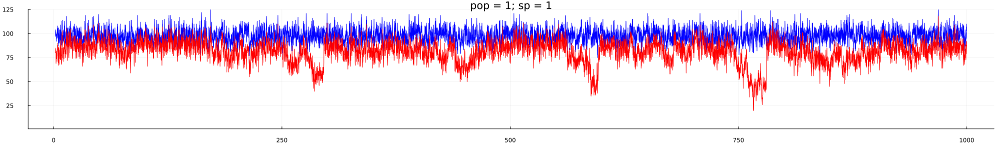

In [10]:
Plot_Demography(X;ylog = false, Time=2:1000,scaleX=5.0,scaleY=0.75)

In [5]:
Plot_traits_infection_success_FREQ_ALLELES(X,trait=1,scaleX=5.0,scaleY=0.75)

In [6]:
Plot_traits_immunity_FREQ_ALLELES(X,trait=1,scaleX=5.0,scaleY=0.75)

# headcounts

In [7]:
X.Storage.Recorded.HostsTraits_immunity_freq[1][1][1][3] .* X.Storage.Recorded.Hosts[1][1] .*2

10001-element Vector{Float64}:
  0.0
 20.0
 18.0
 19.0
 17.0
 13.0
 12.999999999999998
 18.0
 20.0
 19.0
 23.0
 29.0
 29.0
  ⋮
  7.0
  7.0
 10.0
  8.0
  7.0
  9.0
  6.999999999999999
  8.0
  7.999999999999999
  6.0
  7.0
 10.0

# store Alleles frequecies

In [17]:
File = "./Alleles_frequecies.csv" 

open(File, truncate =true) do f
    write(f, join(
            ["Nhosts",
             "FreqImmH".* string.(1:NallelesPerTrait)...,
             "FreqInfH".* string.(1:NallelesPerTrait)...,
             "Nparasits",
             "FreqImmP".* string.(1:NallelesPerTrait)...,
             "FreqInfP".* string.(1:NallelesPerTrait)...
            ]
            ,";"))
    
     for i in 1:length(X.Storage.Recorded.Hosts[1][1])    
        write(f, "\n"*join( [ X.Storage.Recorded.Hosts[1][1][i]
                            ,[X.Storage.Recorded.HostsTraits_immunity_freq[1         ][1][1][allele][i] for allele in 1:NallelesPerTrait]...
                            ,[X.Storage.Recorded.HostsTraits_infection_success_freq[1][1][1][allele][i] for allele in 1:NallelesPerTrait]...
                            , X.Storage.Recorded.Parasites[1][1][i]
                            ,[X.Storage.Recorded.ParasTraits_immunity_freq[         1][1][1][allele][i] for allele in 1:NallelesPerTrait]...
                            ,[X.Storage.Recorded.ParasTraits_infection_success_freq[1][1][1][allele][i] for allele in 1:NallelesPerTrait]...
                ]
            ,";" ) )
     end
end